### Script to integrate cell and nuclei neuronal cell data using scGen

Catherine L Worth, MDC Berlin
<br>
2020 07 20
<br>
catherine.sargent@mdc-berlin.de

In [1]:
import tensorflow as tf
import scgen
import anndata
import scanpy as sc
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import scipy.sparse as sparse
import matplotlib
sc.settings.verbosity = 3

Using TensorFlow backend.
/home/csargen/.conda/envs/scanpy/lib/python3.6/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


In [2]:
# silence NumbaPerformanceWarning
import warnings
from numba.errors import NumbaPerformanceWarning

warnings.filterwarnings("ignore", category=NumbaPerformanceWarning)

In [3]:
sc.settings.set_figure_params(dpi = 120, color_map = 'RdPu', dpi_save = 300, vector_friendly = True)

In [4]:
def filter_by_expression(adata_obj, DE_column, key='rank_genes_groups'):

    def to_tensor(dataframe, columns = [], dtypes = {}, index = False):
        to_records_kwargs = {'index': index}
        if not columns:  # Default to all `dataframe.columns`
            columns = dataframe.columns
        if dtypes:       # Pull in modifications only for dtypes listed in `columns`
            to_records_kwargs['column_dtypes'] = {}
            for column in dtypes.keys():
                if column in columns:
                    to_records_kwargs['column_dtypes'].update({column: dtypes.get(column)})
        return dataframe[columns].to_records(**to_records_kwargs)
    
    gene_names = pd.DataFrame(adata_obj.uns[key]['names'])
    fraction_in_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    fraction_notin_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    in_cluster_expr_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    notin_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    allin_cluster_expr_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    allnotin_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )

    for cluster_number in fraction_in_cluster_matrix.columns:
        
        dummy=adata_obj.raw[:, adata_obj.uns['rank_genes_groups']['names'][cluster_number].tolist()]
        dummy.obs=adata_obj.obs
        dummy.raw = dummy

        subset_cluster=adata_obj[adata_obj.obs[DE_column].isin([cluster_number])]
        tmp=anndata.AnnData(X=dummy.raw.X, obs=adata_obj.obs)
        subset_cluster=tmp[tmp.obs[DE_column].isin([cluster_number])] 
        
        subset_notin_cluster=adata_obj[~adata_obj.obs[DE_column].isin([cluster_number])]
        tmp=anndata.AnnData(X=dummy.raw.X, obs=adata_obj.obs)
        subset_notin_cluster=tmp[~tmp.obs[DE_column].isin([cluster_number])] 
        
        
        
        
   
        # Percent of cluster expressing
        if subset_cluster.shape[0] != 0:
            total_incluster=subset_cluster.shape[0]
        else: 
            total_incluster=np.nan

        if subset_notin_cluster.shape[0] != 0:
            total_outcluster=subset_notin_cluster.shape[0]
        else: 
            total_outcluster=np.nan


        fraction_in_cluster_matrix[cluster_number]=[(subset_cluster.X[:,gene_toanalyze].count_nonzero()/total_incluster) for gene_toanalyze in fraction_in_cluster_matrix.index]
        fraction_notin_cluster_matrix[cluster_number]=[(subset_notin_cluster.X[:,gene_toanalyze].count_nonzero()/total_outcluster) for gene_toanalyze in fraction_notin_cluster_matrix.index]
        
        # Expression level (only by expressed)
        in_cluster_expr_matrix[cluster_number]=[(subset_cluster.X[:,gene_toanalyze][subset_cluster.X[:,gene_toanalyze].nonzero()].mean()) for gene_toanalyze in in_cluster_expr_matrix.index]
        notin_cluster_matrix[cluster_number]=[(subset_notin_cluster.X[:,gene_toanalyze][subset_notin_cluster.X[:,gene_toanalyze].nonzero()].mean()) for gene_toanalyze in notin_cluster_matrix.index]
        # Expression_all in cluster
        allin_cluster_expr_matrix[cluster_number]=[(subset_cluster.X[:,gene_toanalyze].mean()) for gene_toanalyze in allin_cluster_expr_matrix.index]
        allnotin_cluster_matrix[cluster_number]=[(subset_notin_cluster.X[:,gene_toanalyze].mean()) for gene_toanalyze in allnotin_cluster_matrix.index]

    # Generate the last table results
    result = adata_obj.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    result['pc_cells_in'] = to_tensor(fraction_in_cluster_matrix)
    result['pc_cells_out'] = to_tensor(fraction_notin_cluster_matrix)
    result['expr_in'] = to_tensor(allin_cluster_expr_matrix)
    result['expr_out'] = to_tensor(allnotin_cluster_matrix)
    
    results =pd.DataFrame(
        {group + '_' + key: result[key][group]
        for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges', 'pc_cells_in', 'pc_cells_out', "expr_in", "expr_out"]})

    return results
    

In [5]:
def makevector_topmarkers(anndata, top_n, ldFC_cutoff=0.5, pvals_adj_cutoff=10**-30):
    results=anndata.uns['rank_genes_groups']
    clusters = results['names'].dtype.names
    top_genes=[]
    for cluster in clusters:
        topgenes_cluster=results['names'][cluster][np.where((results['logfoldchanges'][cluster]>=ldFC_cutoff) & (results['pvals_adj'][cluster]<(pvals_adj_cutoff)))][0:top_n]
        top_genes.extend(topgenes_cluster)
    return(top_genes)

In [6]:
def stacked_barplot_plain_donor(adata, xaxis, stack, xaxis_label, legend_label, file_name, shift_top=0.2, xaxis_rotation=0):
    tmp=pd.crosstab(adata.obs[xaxis],
                adata.obs[stack]).sum(axis=1)
    ax= pd.crosstab(adata.obs[xaxis],
                    adata.obs[stack]).apply(lambda r: r/r.sum()*100, axis=1)
    ax_1 = ax.plot.bar(figsize=(10,10),stacked=True, rot=0)


    lgd = plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title=legend_label, frameon=False)
    plt.xlabel(xaxis_label)
    plt.ylabel('Percent Distribution')

    for xaxistick in range(ax.shape[0]):
        ax_1.text(xaxistick-shift_top,110,tmp[xaxistick],va='center', rotation=45)
    plt.xticks(rotation=xaxis_rotation)
    ax_1.grid(False)

    plt.savefig(file_name, bbox_extra_artists=(lgd,), bbox_inches='tight')

    plt.show()

In [7]:
conf = tf.ConfigProto()
conf = tf.ConfigProto()
conf.gpu_options.per_process_gpu_memory_fraction=0.7
session = tf.Session(config=conf)

In [8]:
cells = sc.read_h5ad("Bos_Cam_neuronal_cells_20200629_bbknn.h5ad")

In [9]:
cells.shape

(524, 4603)

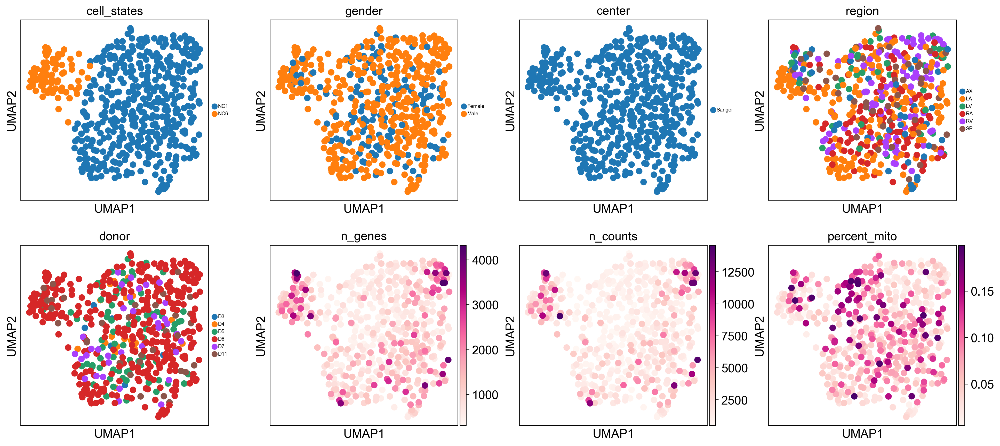

In [10]:
sc.pl.umap(cells, color = ['cell_states', 'gender', 'center', 'region', 'donor', 'n_genes', 'n_counts', 'percent_mito'], legend_fontsize = 6, color_map = 'RdPu')
    

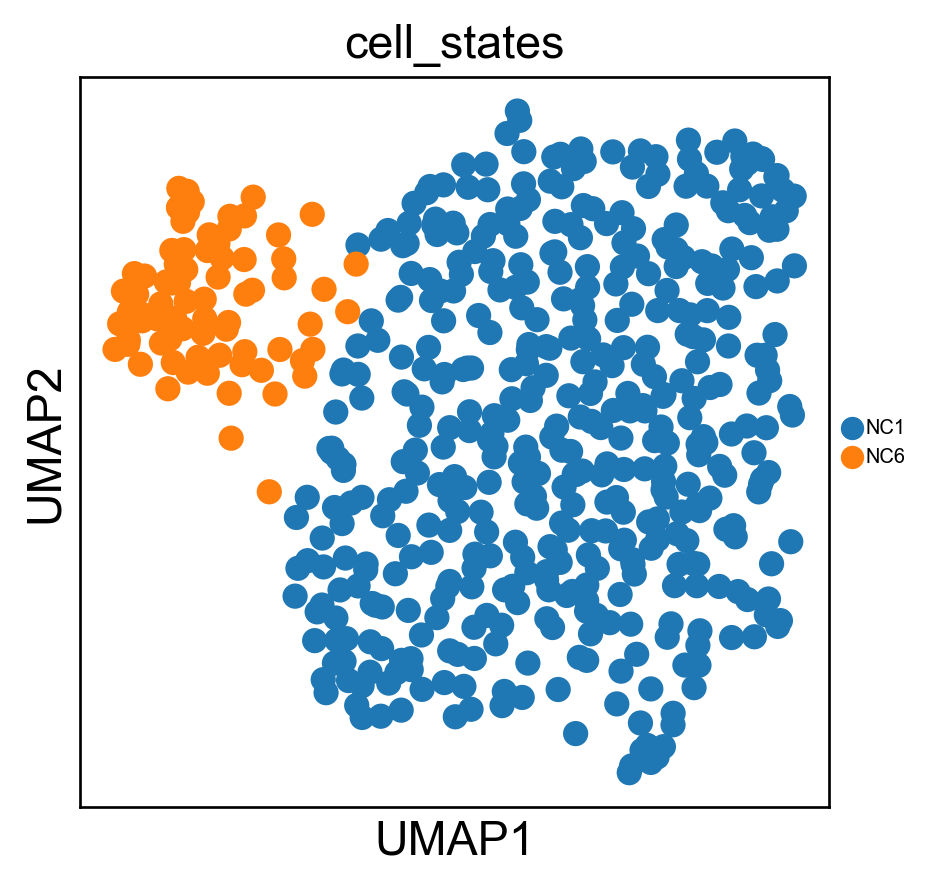

In [11]:
sc.pl.umap(cells, color = ['cell_states'], legend_fontsize = 6, color_map = 'RdPu')

In [12]:
raw_cells= anndata.AnnData(cells.raw.X, var=cells.raw.var, obs=cells.obs, uns=cells.uns)

In [13]:
raw_cells.shape

(524, 33538)

In [14]:
raw_cells.obs['batch']="cells"

In [15]:
tmp_cells=raw_cells.copy()
sc.pp.normalize_per_cell(tmp_cells, counts_per_cell_after=1e4)
sc.pp.log1p(tmp_cells)
tmp_cells.raw=tmp_cells
sc.pp.highly_variable_genes(tmp_cells, n_top_genes=10000)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [16]:
tmp_cells.shape

(524, 33538)

In [17]:
tmp_cells.write("Bos_Cam_neuronal_cells_20200629_RAW.h5ad")

... storing 'batch' as categorical


In [18]:
tmp_cells.obs['batch'].cat.categories

Index(['cells'], dtype='object')

In [19]:
nuclei = sc.read_h5ad("Bos_Cam_neuronal_nuclei_20200629_bbknn.h5ad")

In [20]:
nuclei.obs['batch']="nuclei"

In [21]:
nuclei.shape

(3437, 5245)

... storing 'batch' as categorical


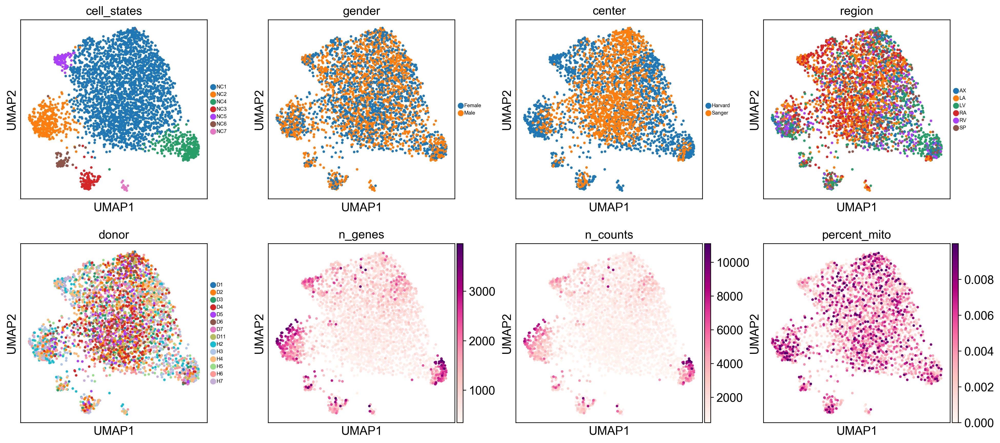

In [22]:
sc.pl.umap(nuclei, color = ['cell_states', 'gender', 'center', 'region', 'donor', 'n_genes', 'n_counts', 'percent_mito'], legend_fontsize = 6, color_map = 'RdPu')
    

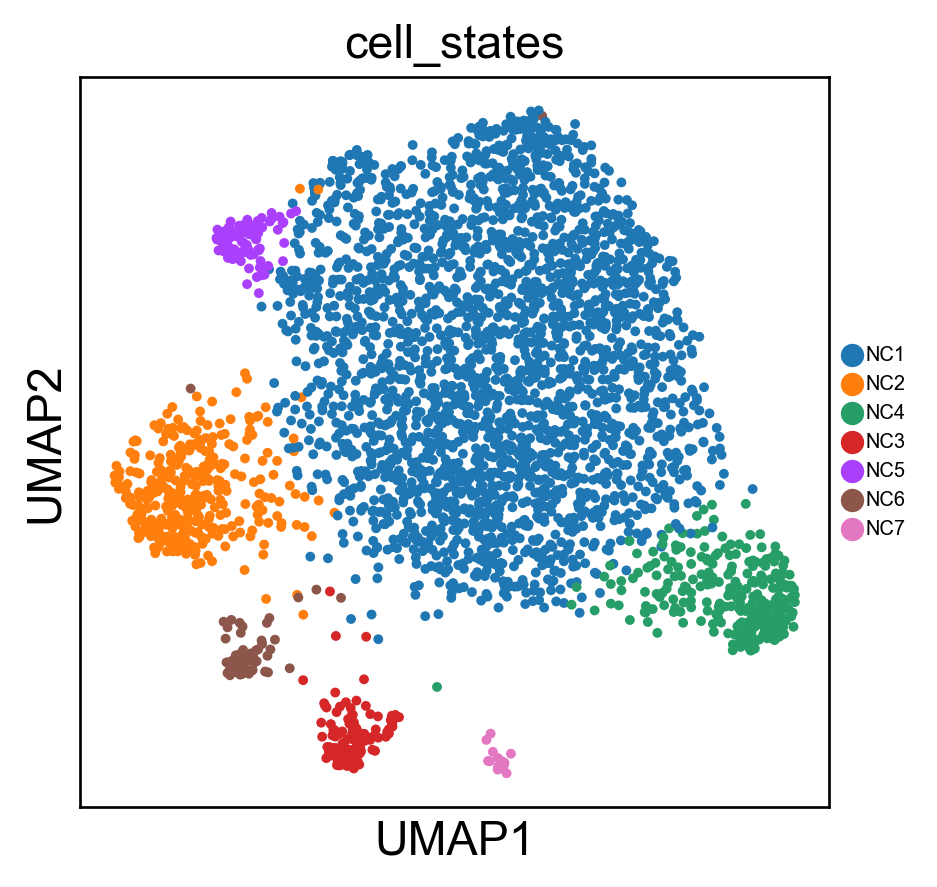

In [23]:
sc.pl.umap(nuclei, color = ['cell_states'], legend_fontsize = 6, color_map = 'RdPu')
    

In [24]:
raw_nuclei= anndata.AnnData(nuclei.raw.X, var=nuclei.raw.var, obs=nuclei.obs, uns=nuclei.uns)

In [25]:
raw_nuclei.shape

(3437, 33538)

In [26]:
raw_nuclei.obs['batch']="nuclei"

In [27]:
tmp_nuc=raw_nuclei.copy()
sc.pp.normalize_per_cell(tmp_nuc, counts_per_cell_after=1e4)
sc.pp.log1p(tmp_nuc)
tmp_nuc.raw=tmp_nuc
sc.pp.highly_variable_genes(tmp_nuc, n_top_genes=10000)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [28]:
tmp_nuc.shape

(3437, 33538)

In [29]:
tmp_nuc.write("Bos_Cam_neuronal_nuclei_20200629_RAW.h5ad")

... storing 'batch' as categorical


In [30]:
tmp_nuc.obs['batch'].cat.categories

Index(['nuclei'], dtype='object')

Concatenate the two objects

In [31]:
NC=raw_nuclei.concatenate(raw_cells)

In [32]:
NC.shape

(3961, 33538)

In [33]:
sc.pp.normalize_per_cell(NC, counts_per_cell_after=1e4)
sc.pp.log1p(NC)
NC.raw = NC

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [34]:
NC = NC[:, (tmp_nuc.var['highly_variable'] & tmp_cells.var['highly_variable'])]
NC.obs['cell_type']=NC.obs['cell_states'].values

Trying to set attribute `.obs` of view, copying.


In [35]:
NC.shape

(3961, 7891)

In [36]:
NC.write("Bos_Cam_neuronal_all_20200629_input.h5ad")

... storing 'age_group' as categorical
... storing 'cell_source' as categorical
... storing 'cell_states' as categorical
... storing 'cell_type' as categorical
... storing 'center' as categorical
... storing 'donor' as categorical
... storing 'leiden' as categorical
... storing 'leiden_0.5' as categorical
... storing 'leiden_0.6' as categorical
... storing 'leiden_annotated' as categorical
... storing 'sample' as categorical
... storing 'source' as categorical


In [37]:
pd.crosstab(NC.obs['cell_source'], NC.obs['cell_type'])

cell_type,NC1,NC2,NC3,NC4,NC5,NC6,NC7
cell_source,,,,,,,
Harvard-Nuclei,1265,267,93,245,86,62,22
Sanger-CD45,225,0,0,0,0,61,0
Sanger-Cells,224,0,0,0,0,14,0
Sanger-Nuclei,1248,73,31,34,1,10,0


In [38]:
batch_categories = [
    'nuclei', 'cells'
]
NC.obs['Batch'] = NC.obs['batch']
NC.obs['batch'].cat.categories = batch_categories

In [39]:
pd.crosstab(NC.obs['batch'], NC.obs['cell_type'])

cell_type,NC1,NC2,NC3,NC4,NC5,NC6,NC7
batch,,,,,,,
nuclei,2513,340,124,279,87,72,22
cells,449,0,0,0,0,75,0


In [40]:
NC.obs['batch'].cat.categories

Index(['nuclei', 'cells'], dtype='object')

In [41]:
NC.obs['cell_states'].cat.categories

Index(['NC1', 'NC2', 'NC3', 'NC4', 'NC5', 'NC6', 'NC7'], dtype='object')

In [42]:
train = NC

Save NC subclusters under cell_type

In [43]:
train.obs["cell_type"] = train.obs["cell_states"].tolist()

In [44]:
train.write_h5ad('NC_train.h5ad')

... storing 'cell_type' as categorical


In [45]:
train.obs['batch'].cat.categories

Index(['nuclei', 'cells'], dtype='object')

In [46]:
train.obs['cell_source'].cat.categories

Index(['Harvard-Nuclei', 'Sanger-CD45', 'Sanger-Cells', 'Sanger-Nuclei'], dtype='object')

In [47]:
sc.pp.neighbors(train)
sc.tl.umap(train)

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA with n_comps = 50
    finished (0:00:02)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


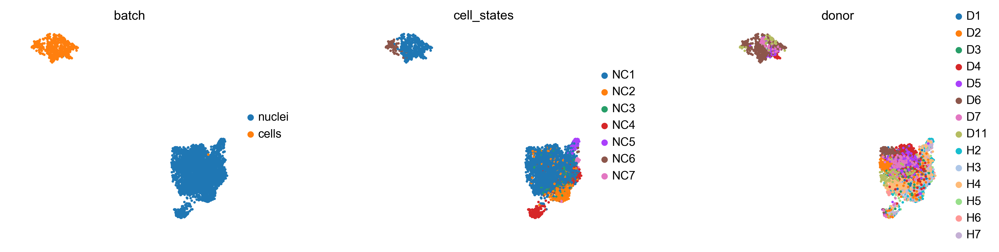

In [48]:
sc.pl.umap(train, color=["batch", "cell_states", "donor"], wspace=.5, frameon=False)

In [49]:
network = scgen.VAEArith(x_dimension= train.shape[1], model_path="./models/batch" )

In [50]:
network.train(train_data=train, n_epochs=10)

In [51]:
corrected_adata =  scgen.batch_removal(network, train, batch_key="batch", cell_label_key="cell_states")

In [52]:
corrected_adata.write_h5ad("NC_corrected_center.h5ad")

... storing 'Batch' as categorical
... storing 'NRP' as categorical
... storing 'age_group' as categorical
... storing 'batch' as categorical
... storing 'cell_source' as categorical
... storing 'cell_states' as categorical
... storing 'cell_type' as categorical
... storing 'center' as categorical
... storing 'donor' as categorical
... storing 'leiden' as categorical
... storing 'leiden_0.5' as categorical
... storing 'leiden_0.6' as categorical
... storing 'leiden_annotated' as categorical
... storing 'region' as categorical
... storing 'sample' as categorical
... storing 'source' as categorical
... storing 'type' as categorical
... storing 'version' as categorical
... storing 'concat_batch' as categorical


In [53]:
sc.pp.neighbors(corrected_adata)
sc.tl.umap(corrected_adata)

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA with n_comps = 50
    finished (0:00:01)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


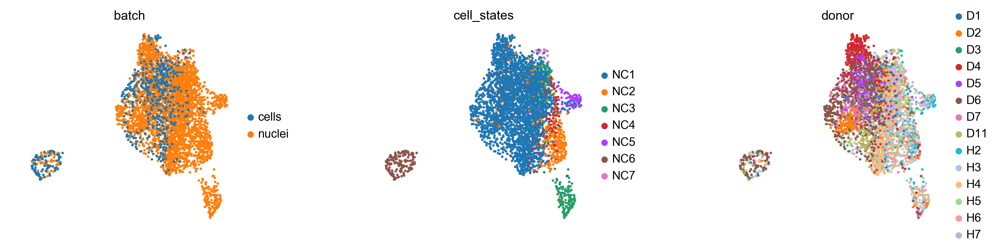

In [55]:
sc.pl.umap(corrected_adata, color=["batch", "cell_states", "donor"], wspace=.5, frameon=False, save = '_center_corrected.png')

In [56]:
corrected_adata.write_h5ad("NC_corrected_center.h5ad")

In [57]:
corrected_adata.obs['batch'] = corrected_adata.obs['donor'].tolist()

In [58]:
network_donor = scgen.VAEArith(x_dimension= corrected_adata.shape[1], model_path="./models2/batch" )

In [59]:
network_donor.train(train_data=corrected_adata, n_epochs=10)

In [60]:
corrected_adata_donor =  scgen.batch_removal(network_donor, corrected_adata, batch_key="batch", cell_label_key="cell_states")

In [62]:
corrected_adata_donor.write_h5ad("NC_corrected_donor.h5ad")

In [63]:
sc.pp.neighbors(corrected_adata_donor, random_state = 100)


computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA with n_comps = 50
    finished (0:00:01)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:01)


In [64]:
sc.tl.umap(corrected_adata_donor, random_state = 100)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


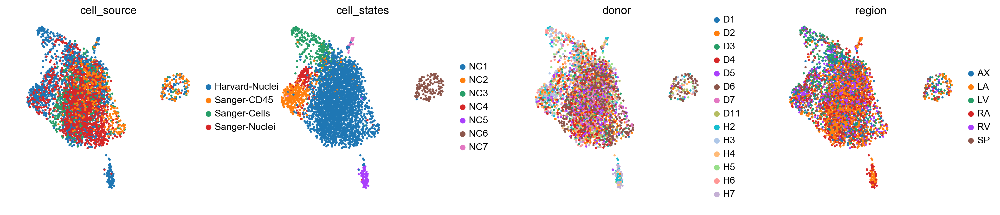

In [65]:
sc.pl.umap(corrected_adata_donor, color=["cell_source", "cell_states", "donor", "region"], wspace=.3, frameon=False, legend_fontsize = 12, save = '_NC_scGen_shared_HVGs.png')

running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


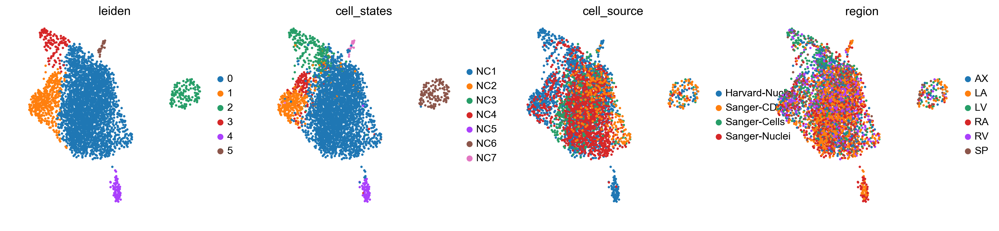

In [66]:
sc.tl.leiden(corrected_adata_donor, resolution = 0.25, random_state = 100)
sc.pl.umap(corrected_adata_donor, color = ['leiden', 'cell_states', 'cell_source', 'region'], legend_fontsize = 12, color_map = 'RdPu', use_raw = True, frameon = False)

In [67]:
NC_cluster_names = [
    'NC1', 'NC2', 'NC3', 'NC4', 'NC5', 'NC6'
]
corrected_adata_donor.obs['leiden_annotated'] = corrected_adata_donor.obs['leiden']
corrected_adata_donor.obs['leiden_annotated'].cat.categories = NC_cluster_names

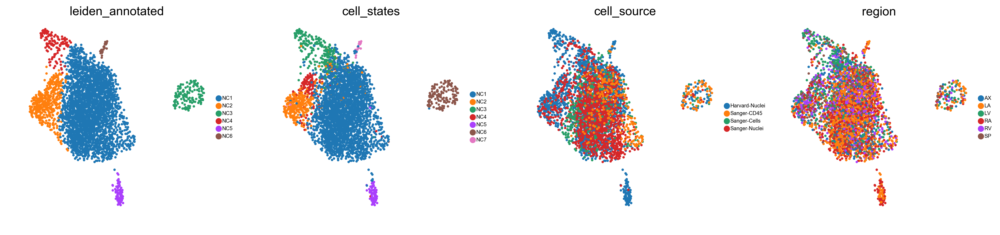

In [68]:
sc.pl.umap(corrected_adata_donor, color = ['leiden_annotated', 'cell_states', 'cell_source', 'region'], legend_fontsize = 6, color_map = 'RdPu', use_raw = True, frameon = False)

In [69]:
corrected_adata_donor.obs['cell_states'] = corrected_adata_donor.obs['leiden_annotated']

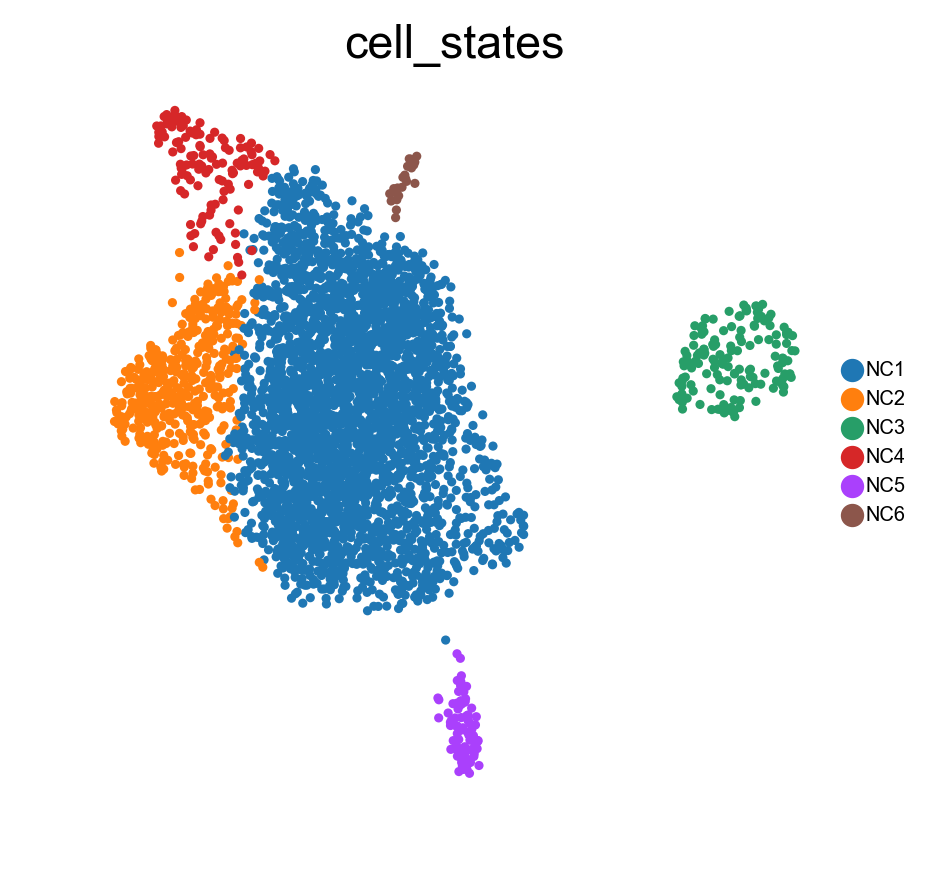

In [70]:
sc.pl.umap(corrected_adata_donor, color = ['cell_states'], legend_fontsize = 6, color_map = 'RdPu', use_raw = True, frameon = False, save = "_NC_cell_states.png")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:13)


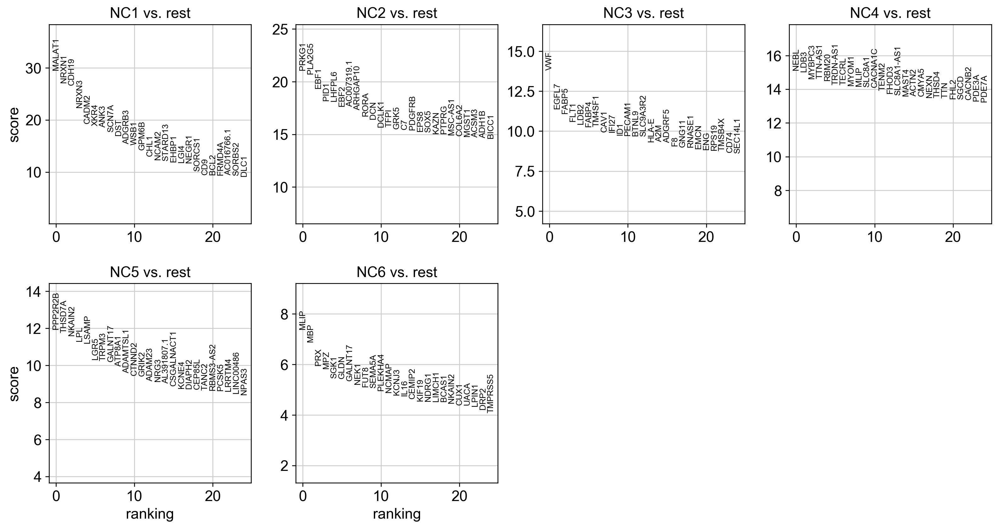

In [71]:
sc.tl.rank_genes_groups(corrected_adata_donor, 'cell_states', method = 'wilcoxon', n_genes=500)
sc.pl.rank_genes_groups(corrected_adata_donor, n_genes=25, sharey=False)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cell_states']`


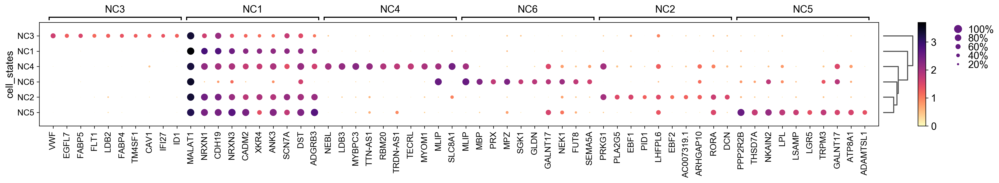

In [72]:
sc.pl.rank_genes_groups_dotplot(corrected_adata_donor, n_genes = 10, color_map = 'magma_r', save='_NC_DE_genes.png')

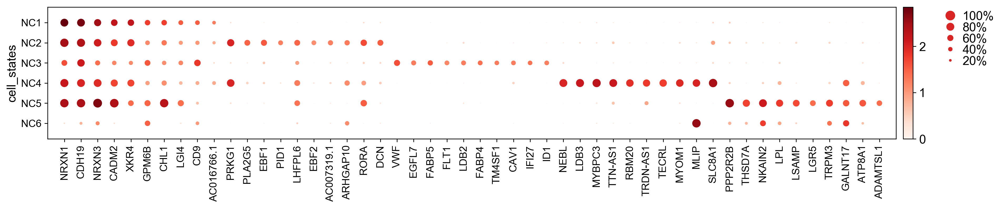

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[17.5, 0, 0.2, 0.5, 0.25])

In [73]:
sc.pl.dotplot(corrected_adata_donor,
              makevector_topmarkers(corrected_adata_donor, 10, ldFC_cutoff=0.8, pvals_adj_cutoff=10**-10),
              groupby='cell_states', use_raw=True, save='_NC_DE_genes_filtered.png')

In [74]:
wilcox_clusters = filter_by_expression(corrected_adata_donor, 'cell_states', key='rank_genes_groups')
wilcox_clusters.to_csv('NC_subclusters_wilcox_markers.csv')

/home/csargen/.conda/envs/scanpy/lib/python3.6/site-packages/scipy/sparse/base.py:585: RuntimeWarning: divide by zero encountered in true_divide
  return self.astype(np.float_)._mul_scalar(1./other)
/home/csargen/.conda/envs/scanpy/lib/python3.6/site-packages/scipy/sparse/base.py:585: RuntimeWarning: divide by zero encountered in true_divide
  return self.astype(np.float_)._mul_scalar(1./other)
/home/csargen/.conda/envs/scanpy/lib/python3.6/site-packages/scipy/sparse/base.py:585: RuntimeWarning: divide by zero encountered in true_divide
  return self.astype(np.float_)._mul_scalar(1./other)
/home/csargen/.conda/envs/scanpy/lib/python3.6/site-packages/scipy/sparse/base.py:585: RuntimeWarning: divide by zero encountered in true_divide
  return self.astype(np.float_)._mul_scalar(1./other)
/home/csargen/.conda/envs/scanpy/lib/python3.6/site-packages/scipy/sparse/base.py:585: RuntimeWarning: divide by zero encountered in true_divide
  return self.astype(np.float_)._mul_scalar(1./other)
/home

In [75]:
wilcox_clusters

,NC1_names,NC1_pvals_adj,NC1_logfoldchanges,NC1_pc_cells_in,NC1_pc_cells_out,NC1_expr_in,NC1_expr_out,NC2_names,NC2_pvals_adj,NC2_logfoldchanges,...,NC5_pc_cells_out,NC5_expr_in,NC5_expr_out,NC6_names,NC6_pvals_adj,NC6_logfoldchanges,NC6_pc_cells_in,NC6_pc_cells_out,NC6_expr_in,NC6_expr_out
0,MALAT1,9.921253e-187,0.581927,0.999361,0.998798,3.697835,3.306709,PRKG1,4.990234e-94,3.442519,...,0.216740,2.551442,0.565674,MLIP,5.114645e-09,5.213512,0.958333,0.114046,2.570856,0.281781
1,NRXN1,1.008256e-157,0.988997,0.894855,0.871394,2.848054,2.218041,PLA2G5,2.941420e-91,4.550921,...,0.089124,1.728872,0.196480,MBP,6.240864e-08,6.361777,0.833333,0.053848,2.339971,0.108017
2,CDH19,4.303289e-152,0.802331,0.890061,0.894231,2.748157,2.238568,EBF1,1.514957e-79,3.622593,...,0.140274,2.124525,0.357934,PRX,1.194728e-05,9.028103,0.708333,0.004064,1.771098,0.009299
3,NRXN3,1.487479e-106,0.828723,0.811441,0.818510,2.499965,1.987301,PID1,3.848619e-70,5.317062,...,0.110824,1.799211,0.250410,MPZ,1.948971e-05,3.762041,0.833333,0.217424,2.354601,0.532229
4,CADM2,8.022712e-79,0.890067,0.751358,0.742788,2.238972,1.709056,LHFPL6,8.267045e-70,3.244248,...,0.071041,1.679016,0.163009,SGK1,1.406039e-04,6.197917,0.666667,0.028194,1.734305,0.061609
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,LINC01122,1.000000e+00,1.331111,0.005433,0.003606,0.014031,0.005600,PPP3CB,4.575781e-09,1.157363,...,0.373289,1.467314,0.897747,ACIN1,1.000000e+00,1.889243,0.250000,0.109982,0.687355,0.236518
496,SUV39H1,1.000000e+00,1.174027,0.005433,0.003606,0.013284,0.005909,ROCK1,4.671628e-09,1.165061,...,0.025575,0.467689,0.057354,TENT2,1.000000e+00,1.064223,0.375000,0.218694,0.853748,0.497656
497,AGAP2-AS1,1.000000e+00,1.283754,0.005433,0.003606,0.013026,0.005371,PDE1C,4.671628e-09,1.051364,...,0.056058,0.526201,0.123256,PSMG2,1.000000e+00,1.612648,0.250000,0.091186,0.511215,0.197383
498,DRD4,1.000000e+00,0.896462,0.005433,0.003606,0.013337,0.007187,LINC00486,4.671628e-09,1.090935,...,0.180315,0.828813,0.414640,NLGN4Y,1.000000e+00,4.467084,0.166667,0.011430,0.402459,0.022156


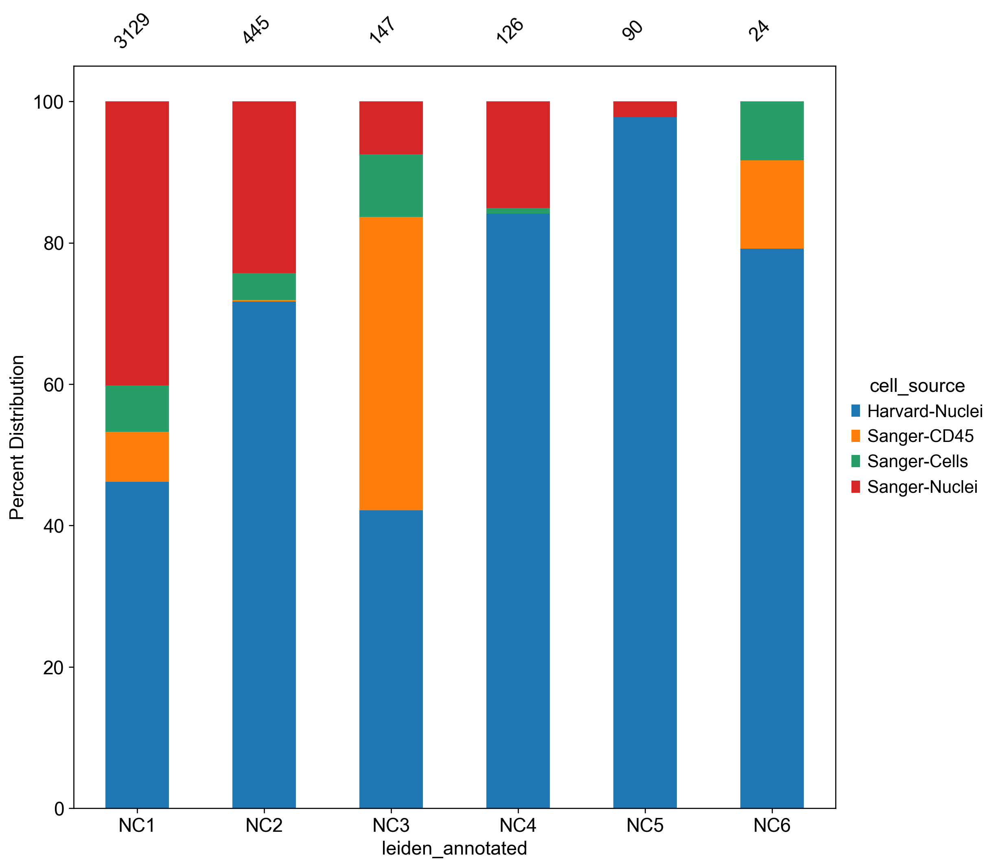

In [76]:
figname = 'NC_cell_source_distribution_subclusters.png'
stacked_barplot_plain_donor(corrected_adata_donor, 'leiden_annotated', 'cell_source', 'leiden_annotated', 'cell_source', figname)

In [77]:
tab = pd.crosstab(corrected_adata_donor.obs['region'],
corrected_adata_donor.obs['cell_states'], normalize='index')
tab

cell_states,NC1,NC2,NC3,NC4,NC5,NC6
region,,,,,,
AX,0.788863,0.134571,0.037123,0.037123,0.000000,0.002320
LA,0.829291,0.070896,0.041978,0.005597,0.041045,0.011194
LV,0.719780,0.140110,0.053571,0.081044,0.002747,0.002747
RA,0.841978,0.066345,0.018094,0.012063,0.053076,0.008444
RV,0.767442,0.169133,0.025370,0.033827,0.000000,0.004228
SP,0.735981,0.172897,0.046729,0.044393,0.000000,0.000000


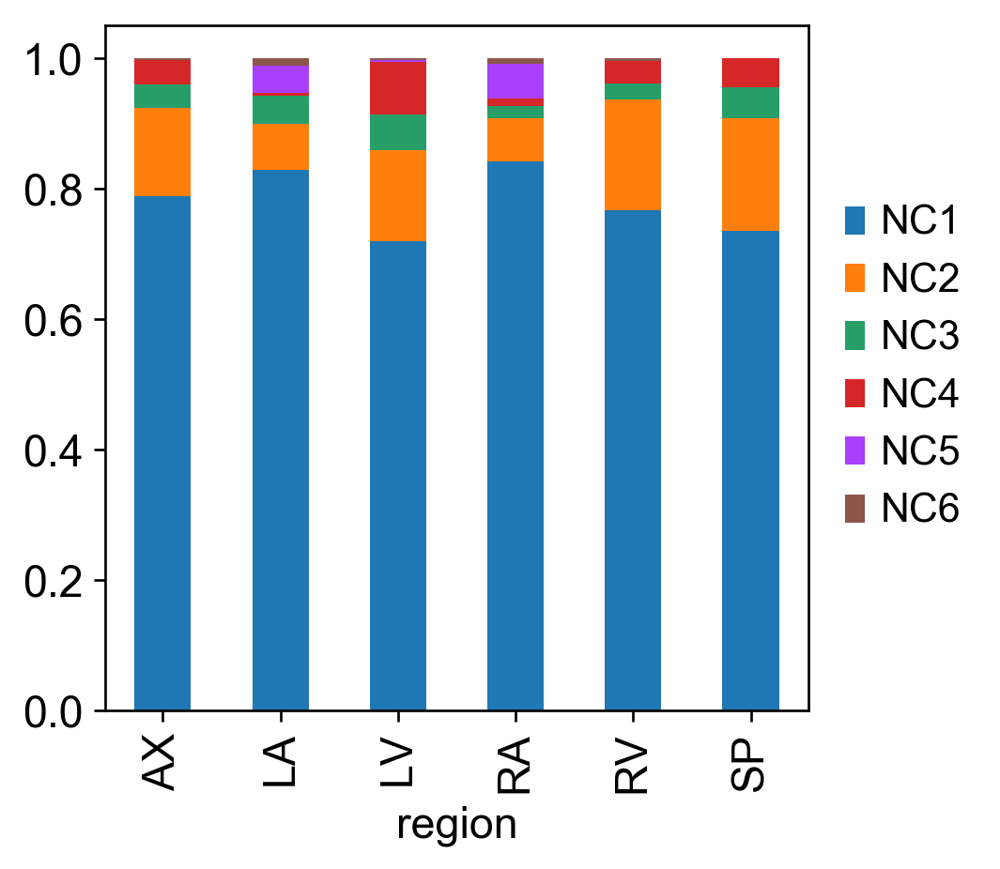

In [78]:
tab.plot.bar(stacked=True, width=0.48)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(b=None)
lgd = plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
plt.savefig('NC_region_distribution_subclusters_all_regions.png', bbox_extra_artists=(lgd,), bbox_inches='tight')

In [79]:
corrected_adata_donor.write_h5ad("NC_scGen_20200629.h5ad")